# Vector time series: SNOTEL data for the Western U.S.

UW Geospatial Data Analysis  
CEE498/CEWA599  
David Shean  

## Objectives
* Explore spatial and temporal relationships of time series data, collected by networks of in-situ stations
* Learn about dynamic API queries, data ingestion into Pandas/GeoPandas
* Working with Pandas Timestamp and Python DateTime objects
* Explore spatial correlation of time series records
* Explore some simple interpolation routines to create continuous gridded values from sparse points
* Explore some fundamental concepts and metrics for snow science

## Discussion
* Two separate dataframes
    * One storing locations of all sites
    * One storing time series of some variable for all sites
* Permanent stations
    * Stream gauge
* Pandas dates
    * https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Timestamp.html
    * groupby/agg
* trajectories
* xarray multiple variables for each station on each day, not just snow depth

## Read a bit about SNOTEL data for the Western U.S.

https://www.wcc.nrcs.usda.gov/snow/

This is actually a nice web interface, with some advanced querying and interactive visualization.  You can also download formatted ASCII files (csv) for analysis.  This is great for one-time projects, but it's nice to have [deterministic code](https://en.wikipedia.org/wiki/Deterministic_system) that can be updated as new data appear, without manual steps.  That's what we're going to do here.

### About SNOTEL sites and data:
* https://www.wcc.nrcs.usda.gov/about/mon_automate.html
* https://www.wcc.nrcs.usda.gov/snotel/snotel_sensors.html
* https://directives.sc.egov.usda.gov/OpenNonWebContent.aspx?content=27630.wba

### Sample plots for SNOTEL site at Paradise, WA (south side of Mt. Rainier)
* https://www.nwrfc.noaa.gov/snow/snowplot.cgi?AFSW1
* We will reproduce some of these plots/metrics during this lab, but do so for the entire SNOTEL network

# CUAHSI WOF server and automated Python data queries

We are going to use a server set up by CUAHSI to serve the SNOTEL data, using a standardized database storage format and query structure.  You don't need to worry about this, but please quickly review the following:
* http://hiscentral.cuahsi.org/pub_network.aspx?n=241 
* http://his.cuahsi.org/wofws.html

### Acronym soup
* SNOTEL = Snow Telemetry
* CUAHSI = Consortium of Universities for the Advancement of Hydrologic Science, Inc
* WOF = WaterOneFlow
* WSDL = Web Services Description Language
* USDA = United States Department of Agriculture
* NRCS = National Resources Conservation Service
* AWDB = Air-Water Database

### Python options

There are a few packages out there that offer convenience functions to query the online SNOTEL databases and unpack the results.  
* climata (https://pypi.org/project/climata/) - last commit Sept 2017 (not a good sign)
* ulmo (https://github.com/ulmo-dev/ulmo) - last commit a Jan 2020 (will be superseded by a package called Quest, but still maintained by Emilio Mayorga over at UW APL)

You can also write your own queries using the Python `requests` module and some built-in XML parsing libraries.

Hopefully not overwhelming amount of information - let's just go with ulmo for now.  I've done most of the work to prepare functions for querying and processing the data.  Once you wrap your head around all of the acronyms, it's pretty simple, basically running a few functions here: https://ulmo.readthedocs.io/en/latest/api.html#module-ulmo.cuahsi.wof

We will use ulmo with daily data for this exercise, but please feel free to experiment with hourly data, other variables or other approaches to fetch SNOTEL data.

### Important ulmo installation note

The current conda-forge build of ulmo is incompatibile with our conda environment (https://github.com/UW-GDA/uwgda-image/blob/master/binder/environment.yml). So we're going to use a development version of ulmo, straight from the github source!  This is a good exercise, and will show you how to grab source code directly from github, then do a "developer install" with pip for local use and development.

To install:
1. Open a terminal on the Jupyterhub and `git clone https://github.com/ulmo-dev/ulmo.git` somewhere in your home directory
2. `cd ulmo`
3. `pip install -e .` (this will run a "developer" install, which means you can modify the source code and use updated versions in real-time)
4. Restart the kernel in your notebook and you should be all set to `import ulmo` without issue
5. Note that if/when your Jupyterlab server restarts, you will need to repeat #3

In [ ]:
import os

In [ ]:
if not os.path.exists('ulmo'):
    !git clone https://github.com/ulmo-dev/ulmo.git
%cd ulmo
!pip install -e .
%cd ..

## 🛑 Restart your kernel if this was the first time installing ulmo 🛑
* This normally shouldn't be necessary, but there are some issues with how `ulmo` is packaged

In [3]:
import ulmo

## Import necessary modules

In [4]:
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import folium
import contextily as ctx
import scipy.stats

## Load our state polygons for later use

In [5]:
states_url = 'http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_5m.json'
#states_url = 'http://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_040_00_500k.json'
states_gdf = gpd.read_file(states_url)

## CUAHSI WOF server information
* Try typing this in a browser, note what you get back

In [6]:
#http://his.cuahsi.org/wofws.html
wsdlurl = 'http://hydroportal.cuahsi.org/Snotel/cuahsi_1_1.asmx?WSDL'
#wsdlurl = "http://worldwater.byu.edu/interactive/snotel/services/index.php/cuahsi_1_1.asmx?WSDL"  # WOF 1.1

# Part 1: Get information about all of the SNOTEL sites from the server
* Use the ulmo cuahsi interface and the `get_sites` function to fetch data from server

In [7]:
sites = ulmo.cuahsi.wof.get_sites(wsdlurl)

If you get an error (`AttributeError: module 'ulmo' has no attribute 'cuahsi'`), you need to restart your kernel and "Run All Above Selected Cell"

In [8]:
#Preview first item in dictionary
next(iter(sites.items()))

('SNOTEL:301_CA_SNTL',
 {'code': '301_CA_SNTL',
  'name': 'Adin Mtn',
  'network': 'SNOTEL',
  'location': {'latitude': '41.2358283996582',
   'longitude': '-120.79192352294922'},
  'elevation_m': '1886.7120361328125',
  'site_property': {'county': 'Modoc',
   'state': 'California',
   'site_comments': 'beginDate=10/1/1983 12:00:00 AM|endDate=1/1/2100 12:00:00 AM|HUC=180200021403|HUD=18020002|TimeZone=-8.0|actonId=20H13S|shefId=ADMC1|stationTriplet=301:CA:SNTL|isActive=True',
   'pos_accuracy_m': '0'}})

## Take a moment to inspect the output

* What is the `type`?
* Note data structure and different key/value pairs for each site 

## Store as a Pandas DataFrame called `sites_df`
* See the `from_dict` function
* Use `orient` option so the sites comprise the DataFrame index, with columns for 'name', 'elevation_m', etc
* Use the `dropna` method to remove any empty records

In [9]:
sites_df = pd.DataFrame.from_dict(sites, orient='index').dropna()
sites_df.head()

,code,name,network,location,elevation_m,site_property
SNOTEL:301_CA_SNTL,301_CA_SNTL,Adin Mtn,SNOTEL,"{'latitude': '41.2358283996582', 'longitude': ...",1886.7120361328125,"{'county': 'Modoc', 'state': 'California', 'si..."
SNOTEL:907_UT_SNTL,907_UT_SNTL,Agua Canyon,SNOTEL,"{'latitude': '37.522171020507813', 'longitude'...",2712.719970703125,"{'county': 'Kane', 'state': 'Utah', 'site_comm..."
SNOTEL:916_MT_SNTL,916_MT_SNTL,Albro Lake,SNOTEL,"{'latitude': '45.59722900390625', 'longitude':...",2529.840087890625,"{'county': 'Madison', 'state': 'Montana', 'sit..."
SNOTEL:1267_AK_SNTL,1267_AK_SNTL,Alexander Lake,SNOTEL,"{'latitude': '61.749668121337891', 'longitude'...",48.768001556396484,"{'county': 'Matanuska-Susitna', 'state': 'Alas..."
SNOTEL:908_WA_SNTL,908_WA_SNTL,Alpine Meadows,SNOTEL,"{'latitude': '47.779571533203125', 'longitude'...",1066.800048828125,"{'county': 'King', 'state': 'Washington', 'sit..."


## Clean up the DataFrame and prepare Point geometry objects
* We covered this with the GLAS data conversion to GeoPandas
* Convert `'location'` column (contains dictionary with `'latitude'` and `'longitude'` values) to Shapely `Point` objects
* Store as a new `'geometry'` column
* Drop the `'location'` column, as this is no longer needed
* Update the `dtype` of the `'elevation_m'` column to float

In [10]:
sites_df['geometry'] = [Point(float(loc['longitude']), float(loc['latitude'])) for loc in sites_df['location']]

In [11]:
sites_df = sites_df.drop(columns='location')
sites_df = sites_df.astype({"elevation_m":float})

## Review output
* Take a moment to familiarize yourself with the DataFrame structure and different columns.
* Note that the index is a set of strings with format 'SNOTEL:1000_OR_SNTL'
* Extract the first record with `loc`
    * Review the `'site_property'` dictionary - could parse this and store as separate fields in the DataFrame if desired

In [12]:
sites_df.head()

,code,name,network,elevation_m,site_property,geometry
SNOTEL:301_CA_SNTL,301_CA_SNTL,Adin Mtn,SNOTEL,1886.712036,"{'county': 'Modoc', 'state': 'California', 'si...",POINT (-120.7919235229492 41.2358283996582)
SNOTEL:907_UT_SNTL,907_UT_SNTL,Agua Canyon,SNOTEL,2712.719971,"{'county': 'Kane', 'state': 'Utah', 'site_comm...",POINT (-112.2711791992188 37.52217102050781)
SNOTEL:916_MT_SNTL,916_MT_SNTL,Albro Lake,SNOTEL,2529.840088,"{'county': 'Madison', 'state': 'Montana', 'sit...",POINT (-111.9590225219727 45.59722900390625)
SNOTEL:1267_AK_SNTL,1267_AK_SNTL,Alexander Lake,SNOTEL,48.768002,"{'county': 'Matanuska-Susitna', 'state': 'Alas...",POINT (-150.8896636962891 61.74966812133789)
SNOTEL:908_WA_SNTL,908_WA_SNTL,Alpine Meadows,SNOTEL,1066.800049,"{'county': 'King', 'state': 'Washington', 'sit...",POINT (-121.6984710693359 47.77957153320312)


In [13]:
sites_df.loc['SNOTEL:301_CA_SNTL']

code                                                   301_CA_SNTL
name                                                      Adin Mtn
network                                                     SNOTEL
elevation_m                                                1886.71
site_property    {'county': 'Modoc', 'state': 'California', 'si...
geometry               POINT (-120.7919235229492 41.2358283996582)
Name: SNOTEL:301_CA_SNTL, dtype: object

In [14]:
sites_df.loc['SNOTEL:301_CA_SNTL']['site_property']

{'county': 'Modoc',
 'state': 'California',
 'site_comments': 'beginDate=10/1/1983 12:00:00 AM|endDate=1/1/2100 12:00:00 AM|HUC=180200021403|HUD=18020002|TimeZone=-8.0|actonId=20H13S|shefId=ADMC1|stationTriplet=301:CA:SNTL|isActive=True',
 'pos_accuracy_m': '0'}

## Convert to a Geopandas GeoDataFrame
* We already have `'geometry'` column, but still need to define the `crs` 
* Note the number of records

In [15]:
sites_gdf_all = gpd.GeoDataFrame(sites_df, crs='EPSG:4326')
sites_gdf_all.shape

(930, 6)

In [16]:
sites_gdf_all.head()

,code,name,network,elevation_m,site_property,geometry
SNOTEL:301_CA_SNTL,301_CA_SNTL,Adin Mtn,SNOTEL,1886.712036,"{'county': 'Modoc', 'state': 'California', 'si...",POINT (-120.79192 41.23583)
SNOTEL:907_UT_SNTL,907_UT_SNTL,Agua Canyon,SNOTEL,2712.719971,"{'county': 'Kane', 'state': 'Utah', 'site_comm...",POINT (-112.27118 37.52217)
SNOTEL:916_MT_SNTL,916_MT_SNTL,Albro Lake,SNOTEL,2529.840088,"{'county': 'Madison', 'state': 'Montana', 'sit...",POINT (-111.95902 45.59723)
SNOTEL:1267_AK_SNTL,1267_AK_SNTL,Alexander Lake,SNOTEL,48.768002,"{'county': 'Matanuska-Susitna', 'state': 'Alas...",POINT (-150.88966 61.74967)
SNOTEL:908_WA_SNTL,908_WA_SNTL,Alpine Meadows,SNOTEL,1066.800049,"{'county': 'King', 'state': 'Washington', 'sit...",POINT (-121.69847 47.77957)


## Create a scatterplot showing elevation values for all sites

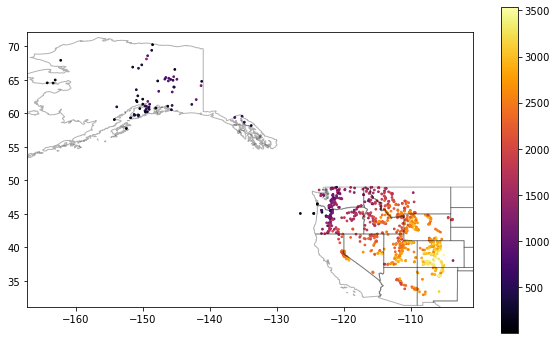

In [17]:
f, ax = plt.subplots(figsize=(10,6))
sites_gdf_all.plot(ax=ax, column='elevation_m', markersize=3, cmap='inferno', legend=True)
ax.autoscale(False)
states_gdf.plot(ax=ax, facecolor='none', edgecolor='k', alpha=0.3);

## Exclude the Alaska (AK) points to isolate points over Western U.S.
* Can remove points where the site name contains 'AK' or can use a spatial filter (see GeoPandas cx indexer functionality)
* Note the number of records

In [18]:
sites_gdf_all = sites_gdf_all[~(sites_gdf_all.index.str.contains('AK'))]
#print(sites_gdf_all.unary_union.centroid)
#xmin, xmax, ymin, ymax = [-126, 102, 30, 50]
#sites_gdf_all = sites_gdf_all.cx[xmin:xmax, ymin:ymax]
sites_gdf_all.shape

(865, 6)

## Update your scatterplot as sanity check
* Should look something like the Western U.S.

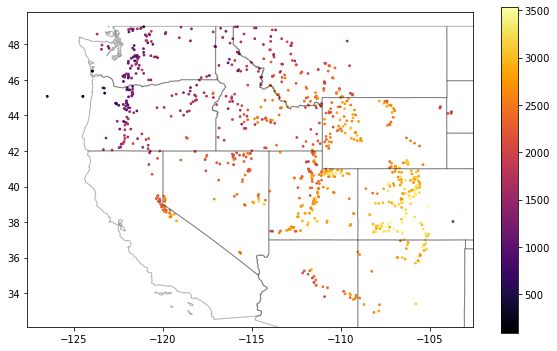

In [19]:
f, ax = plt.subplots(figsize=(10,6))
sites_gdf_all.plot(ax=ax, column='elevation_m', markersize=3, cmap='inferno', legend=True)
ax.autoscale(False)
states_gdf.plot(ax=ax, facecolor='none', edgecolor='k', alpha=0.3);

## Export your Western U.S. sites as a geojson
* We may use these for a later lab

In [20]:
sites_fn = 'snotel_conus_sites.json'
if not os.path.exists(sites_fn):
    sites_gdf_all.to_file(sites_fn, driver='GeoJSON')

## Create an interactive plot with basemap using folium

This was extra credit on the Vector2 lab.  

See the example here: https://python-visualization.github.io/folium/docs-v0.6.0/quickstart.html

For your plot:
* Compute the centroid of the SNOTEL sites (remember GeoPandas `unary_union`)
* Create a folium map object centered on this centroid
    * Use the 'Stamen Terrain' basemap layer
    * Experiment with `zoom_start` level to find a good extent
* Export your GeoDataframe using `to_json()`, then load all features using `folium.features.GeoJson`
* Add the points to the map

Take a moment to explore this interactive map interface.

In [21]:
c = sites_gdf_all.unary_union.centroid
lat = c.y
lon = c.x

In [22]:
m = folium.Map(location=[lat, lon], tiles='Stamen Terrain', zoom_start=5)
points = folium.features.GeoJson(sites_gdf_all.to_json())
m.add_child(points)

## Create a folium map with clustering

* Create an interactive `folium` map with a MarkerCluster that displays the SNOTEL site name and/or ID
* This example is likely useful: https://ocefpaf.github.io/python4oceanographers/blog/2015/12/14/geopandas_folium/

In [23]:
import folium
from folium.plugins import MarkerCluster
m = folium.Map(location=[lat, lon], tiles='Stamen Terrain', zoom_start=5)
#Create clustered map with popups
locations, popups = [], []
for idx,row in sites_gdf_all.iterrows():
    locations.append([row['geometry'].y, row['geometry'].x])
    popups.append(idx)
t = folium.FeatureGroup(name='SNOTEL')
t.add_child(MarkerCluster(locations=locations, popups=popups))
m.add_child(t)

## Create a histogram of SNOTEL site elevations
* What is the highest SNOTEL site in the Western U.S.?
* Do these elevations seem to provide a good sample of elevations where snow accumulates? (just think about this for a minute, I'm hoping we can revisit when we start working with DEM and climate reanalysis data)

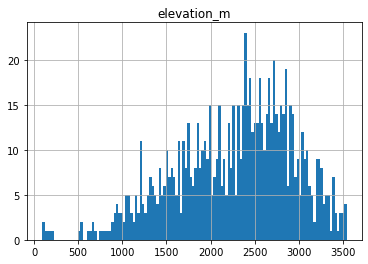

In [24]:
sites_gdf_all.hist('elevation_m', bins=128);

In [25]:
sitecode = sites_gdf_all['elevation_m'].idxmax()

In [26]:
sites_gdf_all.loc[sitecode]

code                                                  1058_CO_SNTL
name                                                      Grayback
network                                                     SNOTEL
elevation_m                                                3541.78
site_property    {'county': 'Rio Grande', 'state': 'Colorado', ...
geometry              POINT (-106.5378265380859 37.47032928466797)
Name: SNOTEL:1058_CO_SNTL, dtype: object

## Reproject the sites GeoDataFrame
* Can use the same Albers Equal Area projection from the GLAS example, or recompute based on bounds and center of SNOTEL sites

In [27]:
sites_gdf_all.total_bounds
aea_proj = '+proj=aea +lat_1=37.31 +lat_2=46.69 +lat_0=42.00 +lon_0=-114.27'
sites_gdf_all_proj = sites_gdf_all.to_crs(aea_proj)

In [28]:
#Reproject states
states_gdf_proj = states_gdf.to_crs(aea_proj)

/srv/conda/envs/notebook/lib/python3.7/site-packages/pyproj/crs.py:77: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.
  return _prepare_from_string(" ".join(pjargs))


## Create a scatterplot and overlay the state polygons

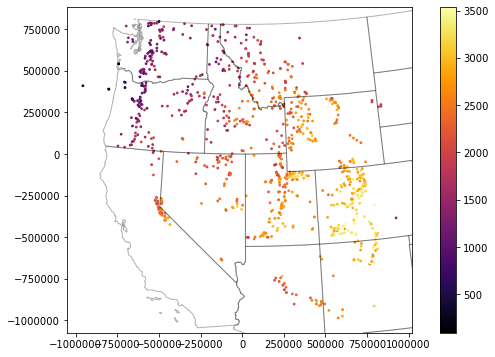

In [29]:
f, ax = plt.subplots(figsize=(10,6))
sites_gdf_all_proj.plot(ax=ax, column='elevation_m', markersize=3, cmap='inferno', legend=True)
ax.autoscale(False)
states_gdf_proj.plot(ax=ax, facecolor='none', edgecolor='k', alpha=0.3);

## Isolate WA sites
* As with the GLAS point example, we could do `intersects` or a spatial join with WA polygon
* But probably easiest to filter records with 'WA' in the index
    * Note: need to convert the SNOTEL DataFrame index to `str`
    * `contains` might be a nice option
* Sanity check - note number of records and create a quick scatterplot to verify

In [30]:
#wa_idx = sites_gdf_all.index.str.contains('WA')
#sites_gdf_wa = sites_gdf_all[wa_idx]
wa_idx = sites_gdf_all_proj.index.str.contains('WA')
sites_gdf_wa = sites_gdf_all_proj[wa_idx]
sites_gdf_wa.shape

(84, 6)

In [31]:
#Prepare list of WA stations for use later in lab
#wa_stations = list(sites_gdf_all_proj.index[wa_idx])
wa_stations = sites_gdf_all_proj.index[wa_idx]
wa_stations

Index(['SNOTEL:908_WA_SNTL', 'SNOTEL:990_WA_SNTL', 'SNOTEL:352_WA_SNTL',
       'SNOTEL:1080_WA_SNTL', 'SNOTEL:1107_WA_SNTL', 'SNOTEL:375_WA_SNTL',
       'SNOTEL:376_WA_SNTL', 'SNOTEL:942_WA_SNTL', 'SNOTEL:1109_WA_SNTL',
       'SNOTEL:1085_WA_SNTL', 'SNOTEL:418_WA_SNTL', 'SNOTEL:420_WA_SNTL',
       'SNOTEL:943_WA_SNTL', 'SNOTEL:998_WA_SNTL', 'SNOTEL:910_WA_SNTL',
       'SNOTEL:995_WA_SNTL', 'SNOTEL:994_WA_SNTL', 'SNOTEL:1004_WA_SNTL',
       'SNOTEL:478_WA_SNTL', 'SNOTEL:1159_WA_SNTL', 'SNOTEL:1256_WA_SNTL',
       'SNOTEL:502_WA_SNTL', 'SNOTEL:507_WA_SNTL', 'SNOTEL:515_WA_SNTL',
       'SNOTEL:991_WA_SNTL', 'SNOTEL:928_WA_SNTL', 'SNOTEL:1129_WA_SNTL',
       'SNOTEL:553_WA_SNTL', 'SNOTEL:591_WA_SNTL', 'SNOTEL:599_WA_SNTL',
       'SNOTEL:606_WA_SNTL', 'SNOTEL:1069_WA_SNTL', 'SNOTEL:999_WA_SNTL',
       'SNOTEL:897_WA_SNTL', 'SNOTEL:1011_WA_SNTL', 'SNOTEL:630_WA_SNTL',
       'SNOTEL:262_WA_SNTL', 'SNOTEL:642_WA_SNTL', 'SNOTEL:644_WA_SNTL',
       'SNOTEL:648_WA_SNTL', 'SNOTEL:898_

In [32]:
#Prepare a list of WA stations above a predefined elevation threshold
high_thresh = 1400
wa_stations_high = sites_gdf_wa.index[sites_gdf_wa['elevation_m'] > high_thresh]
wa_stations_high

Index(['SNOTEL:1080_WA_SNTL', 'SNOTEL:1107_WA_SNTL', 'SNOTEL:375_WA_SNTL',
       'SNOTEL:376_WA_SNTL', 'SNOTEL:1085_WA_SNTL', 'SNOTEL:418_WA_SNTL',
       'SNOTEL:998_WA_SNTL', 'SNOTEL:1004_WA_SNTL', 'SNOTEL:1159_WA_SNTL',
       'SNOTEL:502_WA_SNTL', 'SNOTEL:507_WA_SNTL', 'SNOTEL:515_WA_SNTL',
       'SNOTEL:1129_WA_SNTL', 'SNOTEL:599_WA_SNTL', 'SNOTEL:606_WA_SNTL',
       'SNOTEL:1011_WA_SNTL', 'SNOTEL:630_WA_SNTL', 'SNOTEL:262_WA_SNTL',
       'SNOTEL:642_WA_SNTL', 'SNOTEL:644_WA_SNTL', 'SNOTEL:679_WA_SNTL',
       'SNOTEL:681_WA_SNTL', 'SNOTEL:692_WA_SNTL', 'SNOTEL:707_WA_SNTL',
       'SNOTEL:711_WA_SNTL', 'SNOTEL:1068_WA_SNTL', 'SNOTEL:1043_WA_SNTL',
       'SNOTEL:984_WA_SNTL', 'SNOTEL:264_WA_SNTL', 'SNOTEL:824_WA_SNTL',
       'SNOTEL:832_WA_SNTL', 'SNOTEL:974_WA_SNTL'],
      dtype='object')

In [33]:
#Get WA state polygon
wa_state = states_gdf_proj.loc[states_gdf_proj['NAME'] == 'Washington']

## Create scatterplot to verify and add contextily basemap
* Can specify our AEA crs to the `crs` keyword in the ctx `add_basemap` function to reproject on the fly

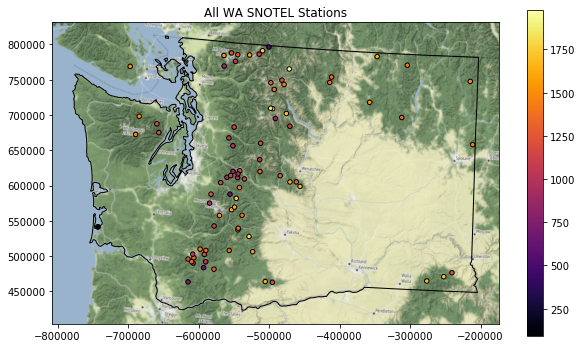

In [34]:
f, ax = plt.subplots(figsize=(10,6))
wa_state.plot(ax=ax, facecolor='none', edgecolor='black')
sites_gdf_wa.plot(column='elevation_m', markersize=20, edgecolor='k', cmap='inferno', legend=True, ax=ax)
ctx.add_basemap(ax=ax, crs=sites_gdf_wa.crs, url=ctx.sources.ST_TERRAIN)
ax.set_title('All WA SNOTEL Stations');

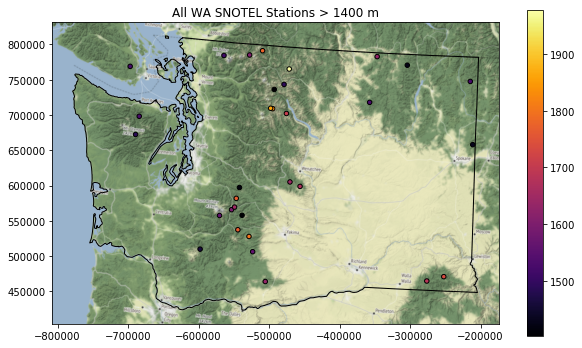

In [35]:
f, ax = plt.subplots(figsize=(10,6))
wa_state.plot(ax=ax, facecolor='none', edgecolor='black')
sites_gdf_wa.loc[wa_stations_high].plot(column='elevation_m', markersize=20, edgecolor='k', cmap='inferno', legend=True, ax=ax)
ctx.add_basemap(ax=ax, crs=sites_gdf_wa.crs, url=ctx.sources.ST_TERRAIN)
ax.set_title('All WA SNOTEL Stations > %0.0f m' % high_thresh);

## Create a histogram plot showing elevation of all SNOTEL sites in Western US and the WA sample
* These should be two histograms on the same axes
* What do you notice about the WA sample?

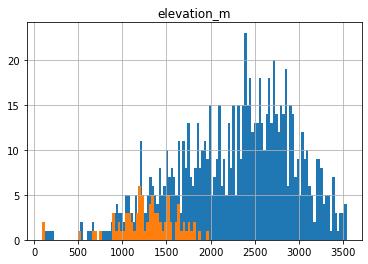

In [36]:
ax = sites_gdf_all.hist('elevation_m', bins=128)
sites_gdf_wa.hist('elevation_m', bins=64, ax=ax);

## Identify the highest site in WA
* Assign the index to a variable named `sitecode`

In [37]:
sitecode_max = sites_gdf_wa['elevation_m'].idxmax()
sitecode = sitecode_max
sites_gdf_wa.loc[sitecode]

code                                                   515_WA_SNTL
name                                                    Harts Pass
network                                                     SNOTEL
elevation_m                                                1978.15
site_property    {'county': 'Okanogan', 'state': 'Washington', ...
geometry              POINT (-471502.7233961484 765225.0585621434)
Name: SNOTEL:515_WA_SNTL, dtype: object

## Query the server for information about this site
* Use the ulmo cuahsi `get_site_info` method here
* Lots of output here, try to skim and get a sense of the different parameters and associated metadata

In [38]:
site_info = ulmo.cuahsi.wof.get_site_info(wsdlurl, sitecode)
#site_info

## Inspect the returned information
* Note number of available variables in the time series data!

In [39]:
dict_keys = site_info['series'].keys()
dict_keys

dict_keys(['SNOTEL:BATT_D', 'SNOTEL:BATT_H', 'SNOTEL:PRCP_y', 'SNOTEL:PRCP_sm', 'SNOTEL:PRCP_m', 'SNOTEL:PRCP_wy', 'SNOTEL:PRCPSA_y', 'SNOTEL:PRCPSA_D', 'SNOTEL:PRCPSA_sm', 'SNOTEL:PRCPSA_m', 'SNOTEL:PRCPSA_wy', 'SNOTEL:PREC_sm', 'SNOTEL:PREC_m', 'SNOTEL:PREC_wy', 'SNOTEL:PVPV_H', 'SNOTEL:RHUMV_H', 'SNOTEL:SNWD_D', 'SNOTEL:SNWD_sm', 'SNOTEL:SNWD_H', 'SNOTEL:SNWD_m', 'SNOTEL:SRAD_D', 'SNOTEL:SRAD_H', 'SNOTEL:SRADN_D', 'SNOTEL:SRADN_sm', 'SNOTEL:SRADN_m', 'SNOTEL:SRADV_D', 'SNOTEL:SRADV_sm', 'SNOTEL:SRADV_H', 'SNOTEL:SRADV_m', 'SNOTEL:SRADX_D', 'SNOTEL:SRADX_sm', 'SNOTEL:SRADX_H', 'SNOTEL:SRADX_m', 'SNOTEL:TAVG_y', 'SNOTEL:TAVG_D', 'SNOTEL:TAVG_sm', 'SNOTEL:TAVG_m', 'SNOTEL:TAVG_wy', 'SNOTEL:TAVG_H', 'SNOTEL:TMAX_y', 'SNOTEL:TMAX_D', 'SNOTEL:TMAX_sm', 'SNOTEL:TMAX_m', 'SNOTEL:TMAX_wy', 'SNOTEL:TMIN_y', 'SNOTEL:TMIN_D', 'SNOTEL:TMIN_sm', 'SNOTEL:TMIN_m', 'SNOTEL:TMIN_wy', 'SNOTEL:TOBS_D', 'SNOTEL:TOBS_sm', 'SNOTEL:TOBS_H', 'SNOTEL:TOBS_m', 'SNOTEL:WDIRV_H', 'SNOTEL:WSPDV_H', 'SNOTEL:WSPDX

In [40]:
len(dict_keys)

60

# Part 2: Time Series Analysis for One Station

## Let's consider the 'SNOTEL:SNWD_D' variable (Daily Snow Depth)
* Assign 'SNOTEL:SNWD_D' to a variable named `variablecode`
* Get some information about the variable using `get_variable_info` method
* Note the units, nodata value, etc.

In [41]:
#variablecode = 'SNOTEL:WTEQ_H'
#variablecode = 'SNOTEL:WTEQ_D'
#variablecode = 'SNOTEL:SNWD_H'
variablecode = 'SNOTEL:SNWD_D'

In [42]:
ulmo.cuahsi.wof.get_variable_info(wsdlurl, variablecode)

{'value_type': 'Field Observation',
 'data_type': 'Continuous',
 'general_category': 'Soil',
 'sample_medium': 'Snow',
 'no_data_value': '-9999',
 'speciation': 'Not Applicable',
 'code': 'SNWD_D',
 'id': '176',
 'name': 'Snow depth',
 'vocabulary': 'SNOTEL',
 'time': {'is_regular': True,
  'interval': '1',
  'units': {'abbreviation': 'd',
   'code': '104',
   'name': 'day',
   'type': 'Time'}},
 'units': {'abbreviation': 'in',
  'code': '49',
  'name': 'international inch',
  'type': 'Length'}}

## Define a function to fetch data
* I've done this for you, but please review the comments and steps to see what is going on under the hood
* You'll probably have to do similar data wrangling for another project at some point in the future

In [43]:
#Get current datetime
today = datetime.today().strftime('%Y-%m-%d')

def fetch(sitecode, variablecode='SNOTEL:SNWD_D', start_date='1950-10-01', end_date=today):
    #print(sitecode, variablecode, start_date, end_date)
    values_df = None
    try:
        #Request data from the server
        site_values = ulmo.cuahsi.wof.get_values(wsdlurl, sitecode, variablecode, start=start_date, end=end_date)
        #Convert to a Pandas DataFrame   
        values_df = pd.DataFrame.from_dict(site_values['values'])
        #Parse the datetime values to Pandas Timestamp objects
        values_df['datetime'] = pd.to_datetime(values_df['datetime'], utc=True)
        #Set the DataFrame index to the Timestamps
        values_df = values_df.set_index('datetime')
        #Convert values to float and replace -9999 nodata values with NaN
        values_df['value'] = pd.to_numeric(values_df['value']).replace(-9999, np.nan)
        #Remove any records flagged with lower quality
        values_df = values_df[values_df['quality_control_level_code'] == '1']
    except:
        print("Unable to fetch %s" % variablecode)

    return values_df

## Use this function to get the full 'SNOTEL:SNWD_D' record for one station
* Can use Paradise station (SNOTEL:679_WA_SNTL), the highest station in WA (from above), or go back up to your folium plot with clusters/labels and pick a site of your choosing!
* Inspect the results
* We used a dummy start date of Jan 1, 1950.  What is the actual the first date returned?

In [44]:
#Hart's Pass
#sitecode = 'SNOTEL:515_WA_SNTL'
#Paradise
sitecode = 'SNOTEL:679_WA_SNTL'

In [45]:
start_date = datetime(1950,1,1)
end_date = datetime.today()

print(sitecode)
values_df = fetch(sitecode, variablecode, start_date, end_date)
#values_df = fetch(sitecode, variablecode)
values_df.head()

SNOTEL:679_WA_SNTL


,value,qualifiers,censor_code,date_time_utc,method_id,method_code,source_code,quality_control_level_code
datetime,,,,,,,,
2006-08-18 00:00:00+00:00,0.0,E,nc,2006-08-18T00:00:00,0,0,1,1
2006-08-19 00:00:00+00:00,0.0,E,nc,2006-08-19T00:00:00,0,0,1,1
2006-08-20 00:00:00+00:00,0.0,E,nc,2006-08-20T00:00:00,0,0,1,1
2006-08-21 00:00:00+00:00,0.0,E,nc,2006-08-21T00:00:00,0,0,1,1
2006-08-22 00:00:00+00:00,0.0,E,nc,2006-08-22T00:00:00,0,0,1,1


In [46]:
#Get number of decimal years between first and last observation
nyears = (values_df.index.max() - values_df.index.min()).days/365.25
nyears

13.971252566735114

## Create a quick plot to view the time series
* Take a moment to inspect the `value` column, which is where the `SNWD_D` values are stored
* What are the units again?

/srv/conda/envs/notebook/lib/python3.7/site-packages/pandas/core/arrays/datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,


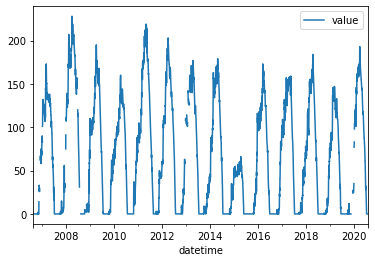

In [47]:
values_df.plot();

## Compute the integer day of year (doy) and integer day of water year (dowy)
* Can get doy for each record with `df.index.dayofyear`
    * Can compute on the fly, but add a new column to store these values
    * https://pandas.pydata.org/pandas-docs/version/0.19/generated/pandas.DatetimeIndex.dayofyear.html
* For the day of water year, you'll need to offset by 9 months, then compute day of year
    * https://en.wikipedia.org/wiki/Water_year
    * Add another column to store these values

In [48]:
#Add DOY and DOWY column
def add_dowy(df):
    df['doy'] = df.index.dayofyear
    #df['dowy'] = (df['doy'].index - pd.DateOffset(months=9)).dayofyear
    # Sept 30 is doy 273
    df['dowy'] = df['doy'] - 273
    df.loc[df['dowy'] <= 0, 'dowy'] += 365

In [49]:
add_dowy(values_df)

In [51]:
#Quick sanity check
values_df['2019-09-28':'2019-10-03']

,value,qualifiers,censor_code,date_time_utc,method_id,method_code,source_code,quality_control_level_code,doy,dowy
datetime,,,,,,,,,,
2019-09-28 00:00:00+00:00,0.0,E,nc,2019-09-28T00:00:00,0,0,1,1,271,363
2019-09-29 00:00:00+00:00,1.0,E,nc,2019-09-29T00:00:00,0,0,1,1,272,364
2019-09-30 00:00:00+00:00,0.0,E,nc,2019-09-30T00:00:00,0,0,1,1,273,365
2019-10-01 00:00:00+00:00,0.0,E,nc,2019-10-01T00:00:00,0,0,1,1,274,1
2019-10-02 00:00:00+00:00,0.0,E,nc,2019-10-02T00:00:00,0,0,1,1,275,2
2019-10-03 00:00:00+00:00,0.0,E,nc,2019-10-03T00:00:00,0,0,1,1,276,3


In [52]:
values_df['2018-12-29':'2019-01-03']

,value,qualifiers,censor_code,date_time_utc,method_id,method_code,source_code,quality_control_level_code,doy,dowy
datetime,,,,,,,,,,
2018-12-29 00:00:00+00:00,76.0,V,nc,2018-12-29T00:00:00,0,0,1,1,363,90
2018-12-30 00:00:00+00:00,70.0,E,nc,2018-12-30T00:00:00,0,0,1,1,364,91
2018-12-31 00:00:00+00:00,69.0,E,nc,2018-12-31T00:00:00,0,0,1,1,365,92
2019-01-01 00:00:00+00:00,69.0,V,nc,2019-01-01T00:00:00,0,0,1,1,1,93
2019-01-02 00:00:00+00:00,68.0,E,nc,2019-01-02T00:00:00,0,0,1,1,2,94
2019-01-03 00:00:00+00:00,68.0,V,nc,2019-01-03T00:00:00,0,0,1,1,3,95


## Compute statistics for each day of water year, using values from all years
* Seems like a Pandas groupby/agg might work here
* Stats should at least include min, max, mean, and median

In [53]:
stat_list = ['count','min','max','mean','std','median','mad']

,count,min,max,mean,std,median,mad
dowy,,,,,,,
1,14,0.0,9.0,0.714286,2.399634,0.0,1.224490
2,14,0.0,8.0,0.571429,2.138090,0.0,1.061224
3,14,0.0,9.0,0.714286,2.399634,0.0,1.224490
4,14,0.0,5.0,0.642857,1.446861,0.0,1.010204
5,14,0.0,5.0,0.642857,1.499084,0.0,1.010204
...,...,...,...,...,...,...,...
361,14,0.0,1.0,0.071429,0.267261,0.0,0.132653
362,14,0.0,1.0,0.071429,0.267261,0.0,0.132653
363,14,0.0,1.0,0.071429,0.267261,0.0,0.132653


## Create a plot of these aggregated dowy values
* Your output independent variable (x-axis) should be day of year (1-366), and dependent variable (y-axis) should be median value for that day of year, computed using values from all available years
    * You may have to explicitly specify the x and y valuese for your plot function
* Something like the 30-year mean and median here: https://www.nwrfc.noaa.gov/snow/plot_SWE.php?id=AFSW1
* Extra credit: add shaded regions for std or normalized median absolute deviation (nmad) for each doy

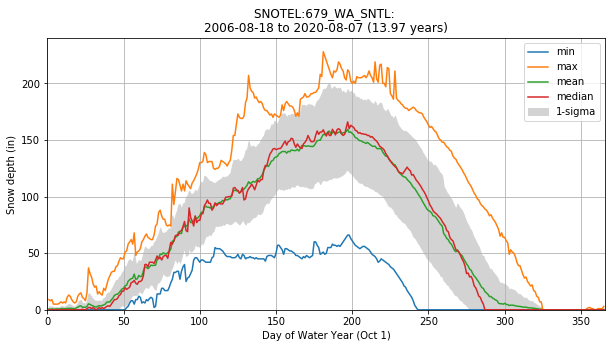

## Plot the data for the current water year (starting Oct 1) and compare with stats for the full record
* Can use pandas indexing here with simple strings ('YYYY-MM-DD'), or Timestamp objects
    * Standard slicing also works with `:`
* Make sure to `dropna` to remove any records missing data
* Add this to your plot

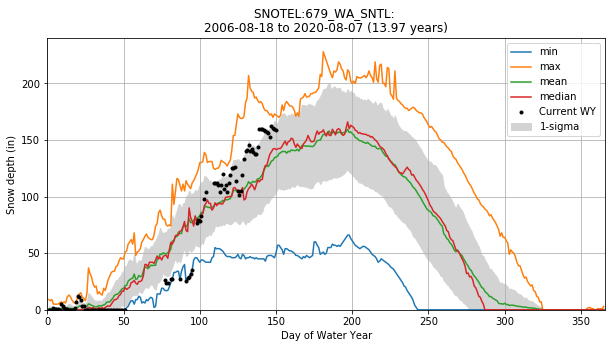

## Is the latest snow depth (from today or yesterday) above the long-term median value for this site?
* What is the percentage of normal snow depth (as defined by long-term median for this dowy)?

112.37% percent of normal snow depth on DOWY 150


# Part 3: Time Series Analysis for **All** SNOTEL Sites
* Now that we've explored one site, let's look at them all!
* Probably some interesting spatial/temporal variability in these metrics

* I've providing the following code to do this for you. Please review so you understand what's going on:
    * Loop through all sites names in the WA GeoDataFrame and run the above `fetch` function
    * Store output in a dictionary
    * Convert the dictionary to a Pandas Dataframe
* Note that this could take some time to run for all SNOTEL sites (~10 min, depending on server load)
    * Progress will be printed out incrementally
    * While you wait, review the remainder of the lab

## Save the DataFrame, so you don't have to download again
* Can use a number of different formats here, easiest to use a "pickle": https://www.pythoncentral.io/how-to-pickle-unpickle-tutorial/
* Define a unique filename for the dataset (e.g., `pkl_fn='snotel_wa_snwd_d.pkl'`)
* Write the DataFrame to disk
* Read it to a temporary variable and verify that everything looks good

In [62]:
#pkl_fn = variablecode.replace(':','_')+'_'+start_date+'_'+end_date+'.pkl'

In [63]:
#All SNOTEL sites
pkl_fn = 'snotel_snwd_d.pkl'
gdf = sites_gdf_all

#Isolated to WA SNOTEL sites
#pkl_fn = 'snotel_snwd_d_wa.pkl'
#gdf = sites_gdf_wa

In [64]:
if os.path.exists(pkl_fn):
    snwd_df = pd.read_pickle(pkl_fn)
else:
    #Define an empty dictionary to store returns for each site
    value_dict = {}
    for i, sitecode in enumerate(gdf.index):
        print('%i of %i sites' % (i+1, len(gdf.index)) )
        #out = fetch(sitecode, variablecode, start_date, end_date)
        out = fetch(sitecode, variablecode)
        if out is not None:
            value_dict[sitecode] = out['value']
    #Convert the dictionary to a DataFrame, automatically handles different datetime ranges (nice!)
    snwd_df = pd.DataFrame.from_dict(value_dict)
    #Write out
    snwd_df.to_pickle(pkl_fn)

## Inspect the DataFrame
* Note structure, number of timestamps, NaNs
* What is the date of the first snow depth measurement in the network?
    * Note that the water equivalent (WTEQ_D) measurements from snow pillows extend much farther back in time, back to the early 1980s, before the ultrasonic snow depth instruments were incorporated across the network.  These are better to use for long-term studies.

In [65]:
snwd_df.shape

(12934, 805)

In [66]:
snwd_df.head()

,SNOTEL:301_CA_SNTL,SNOTEL:907_UT_SNTL,SNOTEL:916_MT_SNTL,SNOTEL:908_WA_SNTL,SNOTEL:302_OR_SNTL,SNOTEL:1000_OR_SNTL,SNOTEL:303_CO_SNTL,SNOTEL:1030_CO_SNTL,SNOTEL:304_OR_SNTL,SNOTEL:306_ID_SNTL,...,SNOTEL:872_WY_SNTL,SNOTEL:873_OR_SNTL,SNOTEL:874_CO_SNTL,SNOTEL:875_WY_SNTL,SNOTEL:876_MT_SNTL,SNOTEL:877_AZ_SNTL,SNOTEL:1228_UT_SNTL,SNOTEL:1197_UT_SNTL,SNOTEL:878_WY_SNTL,SNOTEL:1033_CO_SNTL
datetime,,,,,,,,,,,,,,,,,,,,,
1984-10-01 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-10-02 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-10-03 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-10-04 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1984-10-05 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [67]:
snwd_df.describe()

,SNOTEL:301_CA_SNTL,SNOTEL:907_UT_SNTL,SNOTEL:916_MT_SNTL,SNOTEL:908_WA_SNTL,SNOTEL:302_OR_SNTL,SNOTEL:1000_OR_SNTL,SNOTEL:303_CO_SNTL,SNOTEL:1030_CO_SNTL,SNOTEL:304_OR_SNTL,SNOTEL:306_ID_SNTL,...,SNOTEL:872_WY_SNTL,SNOTEL:873_OR_SNTL,SNOTEL:874_CO_SNTL,SNOTEL:875_WY_SNTL,SNOTEL:876_MT_SNTL,SNOTEL:877_AZ_SNTL,SNOTEL:1228_UT_SNTL,SNOTEL:1197_UT_SNTL,SNOTEL:878_WY_SNTL,SNOTEL:1033_CO_SNTL
count,7882.000000,7818.000000,8569.000000,5749.000000,7144.000000,7105.000000,7028.000000,6048.000000,6113.000000,8440.000000,...,5259.000000,5372.000000,7929.000000,6773.000000,6442.000000,5832.000000,2772.000000,2788.000000,6889.000000,5731.000000
mean,9.842553,7.556152,25.082623,35.085406,27.509658,36.307530,6.518213,29.752149,15.323573,31.336374,...,9.144134,14.740879,34.808803,11.146907,10.395374,4.103738,10.705988,9.181492,18.351285,32.016751
std,14.780480,12.955706,23.631003,42.456484,27.359971,41.118722,9.878518,27.847952,20.008449,34.415279,...,11.344821,19.314029,36.418481,14.436588,12.985679,8.022223,14.341197,12.423662,19.976270,35.135461
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,22.000000,15.000000,21.000000,21.000000,1.000000,25.000000,0.000000,17.000000,...,3.000000,0.000000,26.000000,1.000000,3.000000,0.000000,0.000000,0.000000,10.000000,24.000000
75%,17.000000,12.000000,44.000000,67.000000,49.000000,69.000000,10.000000,55.000000,31.000000,59.000000,...,17.000000,30.000000,62.000000,22.000000,20.000000,3.000000,22.000000,19.000000,34.000000,56.000000
max,66.000000,70.000000,95.000000,175.000000,107.000000,162.000000,68.000000,106.000000,76.000000,174.000000,...,139.000000,75.000000,198.000000,64.000000,61.000000,56.000000,60.000000,55.000000,79.000000,169.000000


## Convert snow depth inches to cm
* Use these values for the remainder of the lab

## Create a histogram of all snow depth values
* Use the Pandas `stack` function here, otherwise you will end up with histograms for each station
* Consider using log scale, as you likely have a spike for days with 0 snow depth

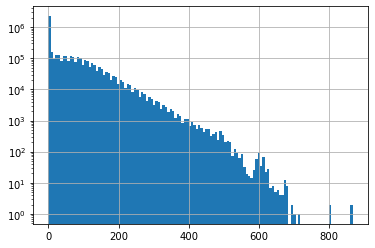

In [70]:
f, ax = plt.subplots()
snwd_df.stack().hist(bins=128, ax=ax, log=True);

## Get the total count of operational stations on each day and plot over time
* Can you identify years where a large number of new snow depth sensors were added to the network?

/srv/conda/envs/notebook/lib/python3.7/site-packages/pandas/core/arrays/datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,


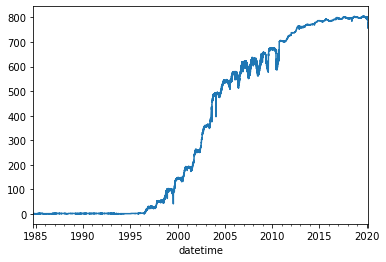

# Consider temporal correlation of snow depth for nearby stations 
* Can use Paradise and nearby station identified on the labeled folium plot above
* Plot the time series from both stations
* Can also use dropna here, but careful about methodology (`any` vs `all`, vs `thresh`)
    * https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.dropna.html

In [75]:
#Highest site
#site1 = 'SNOTEL:863_WA_SNTL'
#site2 = 'SNOTEL:692_WA_SNTL'

In [76]:
#Paradise and nearby sites
site1 = 'SNOTEL:679_WA_SNTL'
site2 = 'SNOTEL:1085_WA_SNTL'
site3 = 'SNOTEL:1257_WA_SNTL'
site4 = 'SNOTEL:941_WA_SNTL'
site5 = 'SNOTEL:642_WA_SNTL'

### Start with two nearby stations

In [77]:
site_list = [site1,site2]
#Use corresponding colors in line and location scatterplots
color_list = ['C%i' % i for i in range(len(site_list))]

In [78]:
snwd_df[site_list]

,SNOTEL:679_WA_SNTL,SNOTEL:1085_WA_SNTL
datetime,,
1984-10-01 00:00:00+00:00,NaN,NaN
1984-10-02 00:00:00+00:00,NaN,NaN
1984-10-03 00:00:00+00:00,NaN,NaN
1984-10-04 00:00:00+00:00,NaN,NaN
1984-10-05 00:00:00+00:00,NaN,NaN
...,...,...
2020-02-24 00:00:00+00:00,411.48,350.52
2020-02-25 00:00:00+00:00,408.94,350.52
2020-02-26 00:00:00+00:00,406.40,345.44


#### Limit to records where both have valid data (drop NaN)

In [79]:
snwd_df[site_list].dropna(thresh=2)

,SNOTEL:679_WA_SNTL,SNOTEL:1085_WA_SNTL
datetime,,
2006-10-05 00:00:00+00:00,0.00,0.00
2006-10-06 00:00:00+00:00,0.00,0.00
2006-10-07 00:00:00+00:00,0.00,0.00
2006-10-08 00:00:00+00:00,0.00,0.00
2006-10-09 00:00:00+00:00,0.00,0.00
...,...,...
2020-02-23 00:00:00+00:00,388.62,340.36
2020-02-24 00:00:00+00:00,411.48,350.52
2020-02-25 00:00:00+00:00,408.94,350.52


### Plot location and time series

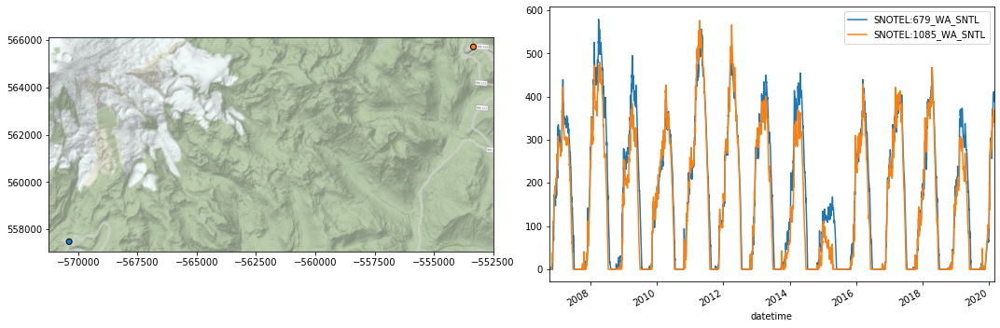

In [80]:
f, axa = plt.subplots(1,2,figsize=(15,5))
sites_gdf_wa.loc[site_list].plot(facecolor=color_list, edgecolor='k', ax=axa[0])
ctx.add_basemap(ax=axa[0], crs=sites_gdf_wa.crs, url=ctx.sources.ST_TERRAIN, alpha=0.7)
snwd_df[site_list].dropna(thresh=2).plot(ax=axa[1])
plt.tight_layout()

## Determine Pearson's correlation coefficient for the two time series
* https://en.wikipedia.org/wiki/Pearson_correlation_coefficient
* See the Pandas `corr` method
    * This should properly handle nan under the hood!

,SNOTEL:679_WA_SNTL,SNOTEL:1085_WA_SNTL
SNOTEL:679_WA_SNTL,1.000000,0.971575
SNOTEL:1085_WA_SNTL,0.971575,1.000000


### Now repeat for several nearby sites

In [86]:
site_list = [site1,site2,site3,site4,site5]
#Use corresponding colors in line and location scatterplots
color_list = ['C%i' % i for i in range(len(site_list))]

In [87]:
mygdf = sites_gdf_wa.loc[site_list]
mygdf

,code,name,network,elevation_m,site_property,geometry
SNOTEL:679_WA_SNTL,679_WA_SNTL,Paradise,SNOTEL,1563.624023,"{'county': 'Pierce', 'state': 'Washington', 's...",POINT (-570383.987 557480.174)
SNOTEL:1085_WA_SNTL,1085_WA_SNTL,Cayuse Pass,SNOTEL,1597.151978,"{'county': 'Pierce', 'state': 'Washington', 's...",POINT (-553333.854 565706.783)
SNOTEL:1257_WA_SNTL,1257_WA_SNTL,Skate Creek,SNOTEL,1149.095947,"{'county': 'Lewis', 'state': 'Washington', 'si...",POINT (-578043.436 542609.124)
SNOTEL:941_WA_SNTL,941_WA_SNTL,Mowich,SNOTEL,963.168030,"{'county': 'Pierce', 'state': 'Washington', 's...",POINT (-584508.685 574983.525)
SNOTEL:642_WA_SNTL,642_WA_SNTL,Morse Lake,SNOTEL,1648.968018,"{'county': 'Yakima', 'state': 'Washington', 's...",POINT (-549073.906 569396.459)


/srv/conda/envs/notebook/lib/python3.7/site-packages/pandas/core/arrays/datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,


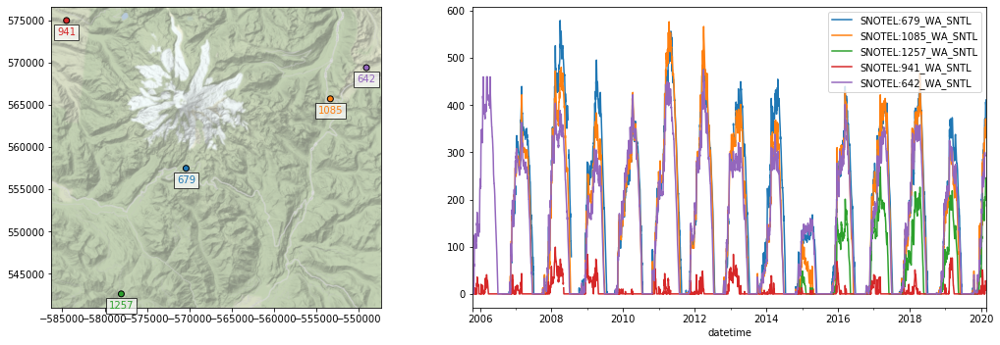

In [88]:
f, axa = plt.subplots(1,2,figsize=(15,5))
mygdf.plot(facecolor=color_list, edgecolor='k', ax=axa[0])
for x, y, label, c in zip(mygdf.geometry.x, mygdf.geometry.y, mygdf.code.str.split('_').str[0], color_list):
    axa[0].annotate(label, xy=(x,y), xytext=(0, -15), ha='center', textcoords="offset points", color=c, bbox=dict(boxstyle="square",fc='w',alpha=0.7))
ctx.add_basemap(ax=axa[0], crs=sites_gdf_wa.crs, url=ctx.sources.ST_TERRAIN, alpha=0.7)
snwd_df[site_list].dropna(thresh=2).plot(ax=axa[1])
plt.tight_layout()

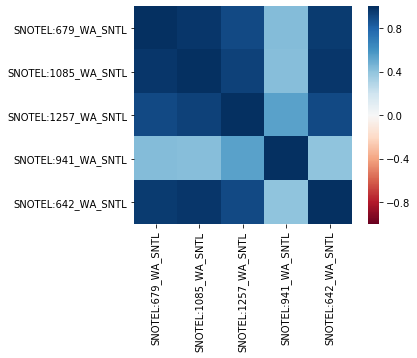

In [92]:
import seaborn as sns
sns.heatmap(snwd_corr, cmap='RdBu', vmin=-1, vmax=1, square=True);

## Extra Credit: Consider spatial variability of these correlation coefficients
* Select a reference station
* Compute correlation scores with this reference station
    * Join the correlation score values with original GeoDataFrame containing Point geometries
* Create a scatter plot (map) of correlation score

In [93]:
ref = site1

/srv/conda/envs/notebook/lib/python3.7/site-packages/pandas/core/arrays/datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,


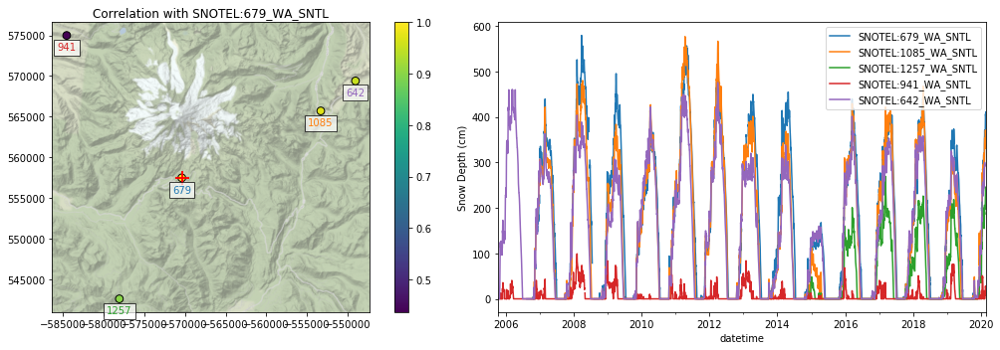

In [94]:
f, axa = plt.subplots(1,2,figsize=(15,5))
#Join the ref site correlation scores with the original geodataframe and plot
mygdf.join(snwd_corr[ref]).plot(ax=axa[0], column=ref, legend=True, markersize=60, edgecolor='k')
#sites_gdf_wa.loc[site_list].join(snwd_corr[ref]).plot(ax=ax, column=ref, legend=True, markersize=100, edgecolor=color_list, lw=2.0)
for x, y, label, c in zip(mygdf.geometry.x, mygdf.geometry.y, mygdf.code.str.split('_').str[0], color_list):
    axa[0].annotate(label, xy=(x,y), xytext=(0, -15), ha='center', textcoords="offset points", color=c, bbox=dict(boxstyle="square",fc='w',alpha=0.7))
#Plot the reference site
sites_gdf_wa.loc[[ref,ref]].plot(ax=axa[0], marker='+', markersize=200, color='r')
ctx.add_basemap(ax=axa[0], crs=sites_gdf_wa.crs, url=ctx.sources.ST_TERRAIN, alpha=0.7)
axa[0].set_title("Correlation with %s" % ref)
snwd_df[site_list].dropna(thresh=2).plot(ax=axa[1]);
axa[1].set_ylabel('Snow Depth (cm)')
plt.tight_layout()

## Extra Credit: Consider the correlation as a function of distance from the reference station
* Compute the distance in km between the reference station and all other stations
* Create a plot of correlation coefficient vs. distance

### Extra Credit: Consider correlation between reference station and **all** SNOTEL stations in Western U.S.
* Consider correlation vs. distance
* Consider correlation vs. elevation (relative to ref station elevation)

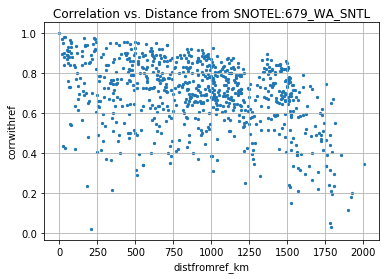

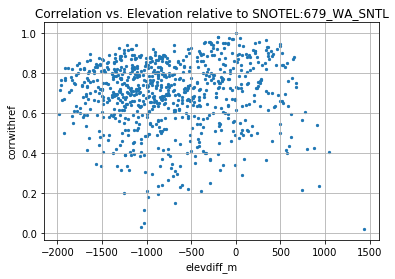

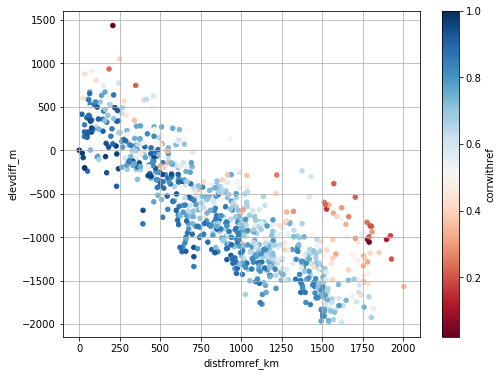

### Create a map to consider spatial variability in correlation

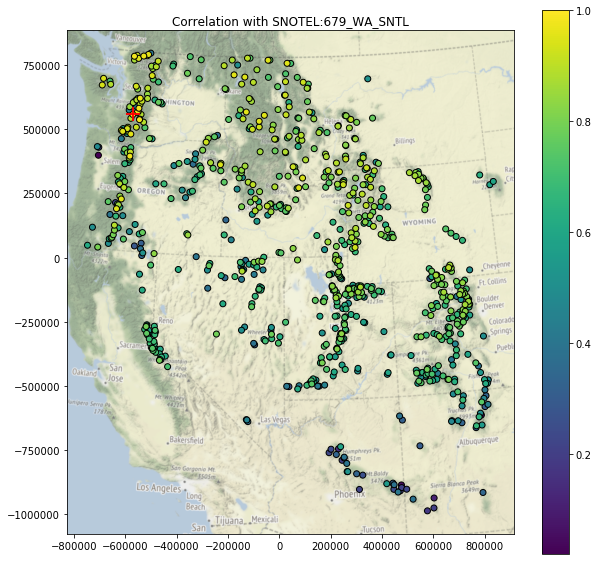

# Compute daily snow depth difference for all stations
* This represents daily snow accumulation or ablation
* See the Pandas `diff` function
    * Make sure you specify the axis properly to difference over time (not station to station), and sanity check
    * This should correctly account for missing values, but need to double-check
* Sanity check with `tail` - most values should be relatively small (+/-1-6)

## Create plot showing this daily accumulation for all sites
* Can start by trying to plot a subset of sites
    * May take ~1-2 min to plot all ~800 sites
* Adjusting the ylim appropriately
* Probably best to set `legend=False` in your plot call
* Add a black horizontal line at 0 with linewidth=0.5

/srv/conda/envs/notebook/lib/python3.7/site-packages/pandas/core/arrays/datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,


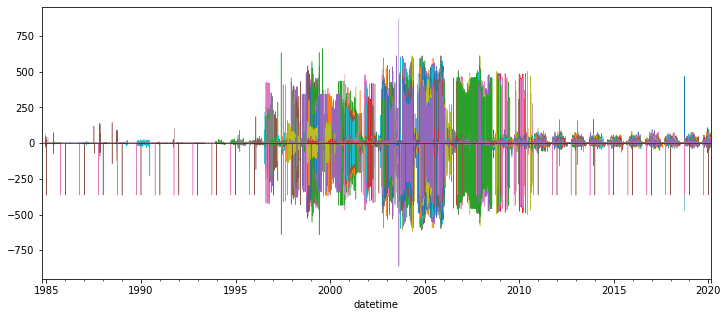

## Interpretation (Answer these questions)
* Do you think you can confidently identify large snow accumulation events using these difference values?
* Are some periods noisier than others?
* When the snow depth increases from one day to the next, what happened?
* When the snow depth decreases from one day to the next, what happened?
    * Hint: during the winter, some days never get above freezing, but snow depths still decrease...

## Extra Credit: Design filters to remove artifacts and outliers
* Could likely design a series of filters to remove outliers from original snow depth value time series and the difference time series for each site
* One idea:
    * What is the maximum amount of snowfall you would expect in a 24-hour period? 
    * How about the maximum decrease in snow depth in a 24-hour period?
* Can also combine multiple stations for another round of filters:
    * If a single station shows an increase of 2 m, but all others show a decrease, is that realistic?
* Other considerations:
    * mean +/- (3 * std) is often used to remove outliers from normally distributed values (but is this the case for your difference values?)
* Maybe come back to this if you have time later, for now, just note the presence of measurement errors

/srv/conda/envs/notebook/lib/python3.7/site-packages/pandas/core/arrays/datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,


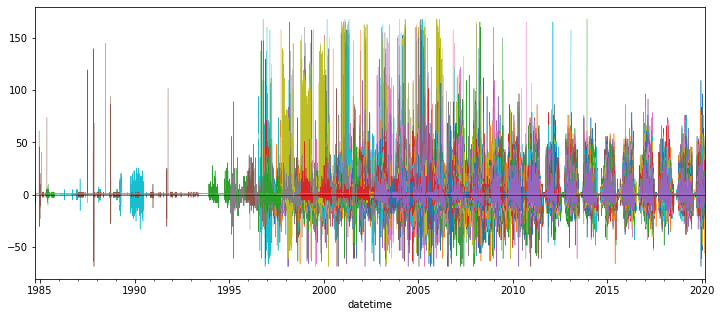

## For now, let's aggregate across all stations using robust statistics
* Create a plot showing the median difference values across all stations for each day in the record (not doy, but all days with data)
    * Again, careful about which axis along which you're computing the median
* You may need to adjust the ylim to bring out detail if you haven't removed outliers

/srv/conda/envs/notebook/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:994: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanmedian1d, axis, a, overwrite_input)
/srv/conda/envs/notebook/lib/python3.7/site-packages/pandas/core/arrays/datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,


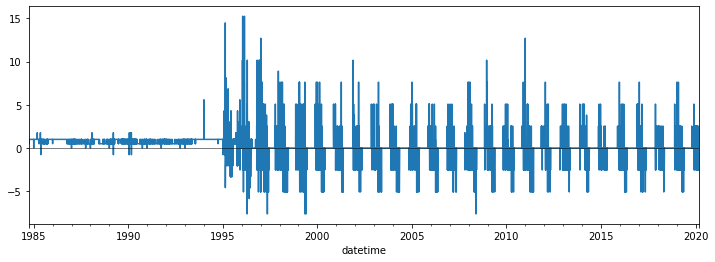

## Create a similar plot, but limit to records since Jan 1 of current year
* Can you identify any big snow events?  

/srv/conda/envs/notebook/lib/python3.7/site-packages/pandas/core/arrays/datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,


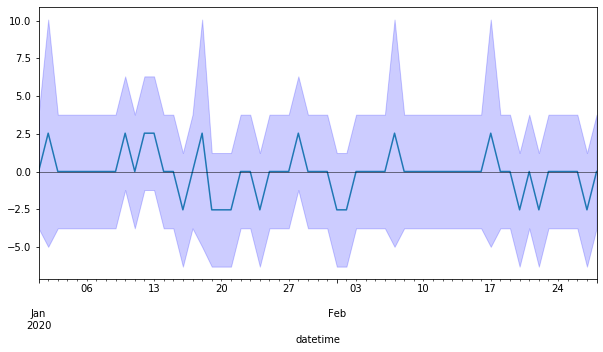

## Now plot just the WA stations (use the `wa_stations` index we already calculated)
* Can do this with `snwd_df_diff.loc[:,wa_stations]`
* What date had the greatest daily snow accumulation across all stations in WA?

In [126]:
wa_stations

Index(['SNOTEL:908_WA_SNTL', 'SNOTEL:990_WA_SNTL', 'SNOTEL:352_WA_SNTL',
       'SNOTEL:1080_WA_SNTL', 'SNOTEL:1107_WA_SNTL', 'SNOTEL:375_WA_SNTL',
       'SNOTEL:376_WA_SNTL', 'SNOTEL:942_WA_SNTL', 'SNOTEL:1109_WA_SNTL',
       'SNOTEL:1085_WA_SNTL', 'SNOTEL:418_WA_SNTL', 'SNOTEL:420_WA_SNTL',
       'SNOTEL:943_WA_SNTL', 'SNOTEL:998_WA_SNTL', 'SNOTEL:910_WA_SNTL',
       'SNOTEL:995_WA_SNTL', 'SNOTEL:994_WA_SNTL', 'SNOTEL:1004_WA_SNTL',
       'SNOTEL:478_WA_SNTL', 'SNOTEL:1159_WA_SNTL', 'SNOTEL:1256_WA_SNTL',
       'SNOTEL:502_WA_SNTL', 'SNOTEL:507_WA_SNTL', 'SNOTEL:515_WA_SNTL',
       'SNOTEL:991_WA_SNTL', 'SNOTEL:928_WA_SNTL', 'SNOTEL:1129_WA_SNTL',
       'SNOTEL:553_WA_SNTL', 'SNOTEL:591_WA_SNTL', 'SNOTEL:599_WA_SNTL',
       'SNOTEL:606_WA_SNTL', 'SNOTEL:1069_WA_SNTL', 'SNOTEL:999_WA_SNTL',
       'SNOTEL:897_WA_SNTL', 'SNOTEL:1011_WA_SNTL', 'SNOTEL:630_WA_SNTL',
       'SNOTEL:262_WA_SNTL', 'SNOTEL:642_WA_SNTL', 'SNOTEL:644_WA_SNTL',
       'SNOTEL:648_WA_SNTL', 'SNOTEL:898_

/srv/conda/envs/notebook/lib/python3.7/site-packages/pandas/core/arrays/datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,


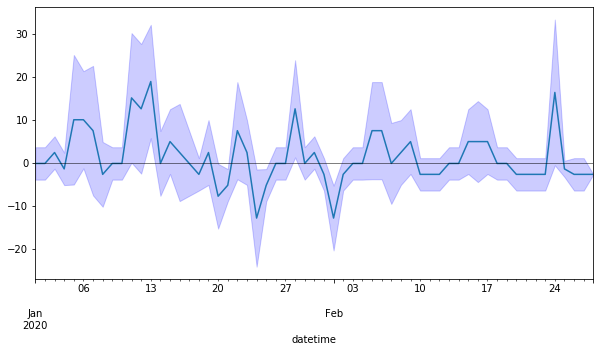

## Extra Credit: Repeat for WA high elevation sites (defined earlier)

/srv/conda/envs/notebook/lib/python3.7/site-packages/pandas/core/arrays/datetimes.py:1269: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  UserWarning,


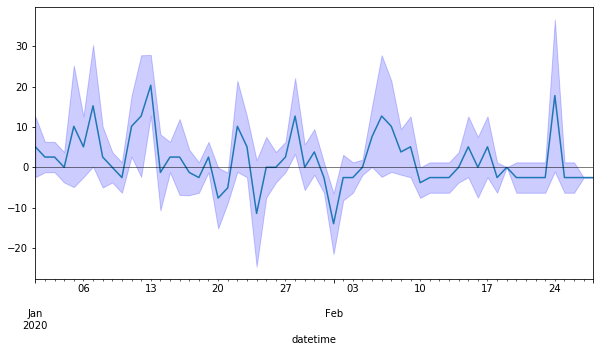

# Part 5: Compute statistics for all time series and evaluate spatial variability
* So, now we're going back to our GeoDataFrame containing Point geometry for all sites, and adding some key metrics

In [148]:
col_list = []

## Get the count of valid daily records (not NaN) available for each station
* Which station has the greatest number of observations for SNWD_D?

## Add the count of valid records for each station a new column in our original WA sites GeoDataframe
* Should be straightforward, let Pandas do the work to match site index values
* Verify your site DataFrame now has a count column

## Add a column for the long-term max snow depth on record for each site
* Might need to be careful about measurement errors here - maybe look at values and filter obvious outliers
* Could also consider a threshold for minimum count of valid days

## Add a column for the daily difference (snow accumulation) at all sites for Feb 12, 2019
* Note, Pandas uses a `Timestamp` object that wraps the commond Python `datetime` objects
* pd.Timestamp('YYYY-MM-DD')
* Note, you may need to use `mydataframe.loc[pd.Timestamp('YYYY-MM-DD')]`

## Add a column for the snow depth for a recent day (say, yesterday) in the time series
* Use a relative index value here to get the latest Timestamp (like -1, or maybe -2)
    * Note that using timestamp for today could have limited returns, as latest data from some stations have not been integrated into database
* Note that the index is not a string, it is a Pandas Timestamp object: `pd.Timestamp('2019-02-06 00:00:00')`

## Compute the long-term median snow depth for this same doy
* See earlier example, where we grouped by `df.index.dayofyear`, then aggregated

## Add a column for the percent of "normal" snow depth for most recent day
* Use the long-term daily median, as we did for a single site earlier

## Add a column for _total_ snow accumulation in February 2020 at each site
* Use a `slice` object of pandas Timestamps
* You'll want to isolate and include the days with positive snow accumulation (excluding days where no new snow fell)
    * Can then compute a sum!

## Add a column for the long-term mean snow depth at each site
* Note: to do this properly, probably want to remove any values near 0 (no snow on the ground) before computing the mean
    * Maybe a threshold of 1 cm?

# Create some scatterplots to review these metrics
* Hint: remove NaN records on the fly before plotting - see the `dropna()` method
    * Best to apply after isolating the column you want to plot, consider `mydataframe[['max', 'geometry]].dropna().plot(column='max', ...)`
* Can plot separately, or create a figure with multiple subplots, and add titles/labels appropriately
* I defined a function to create a single plot for a given column name, and then ran this function for each column name I wanted to plot

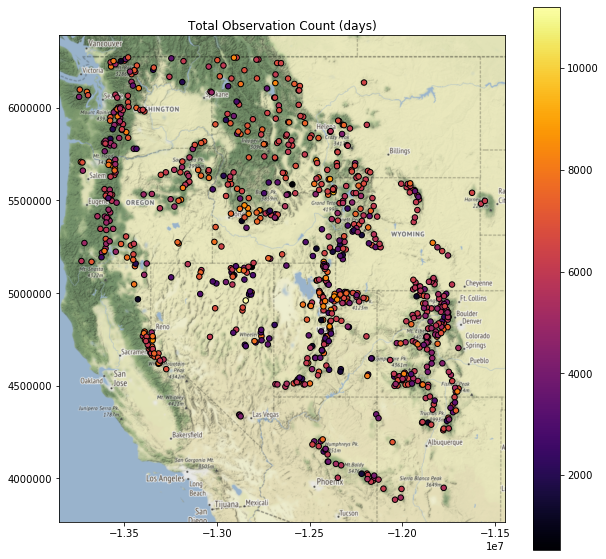

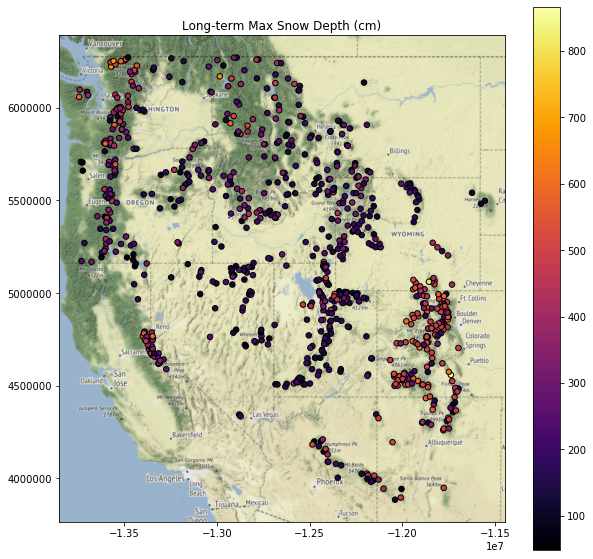

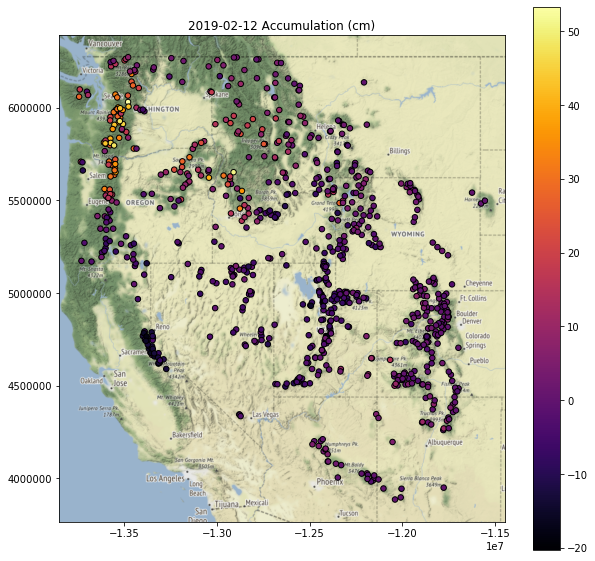

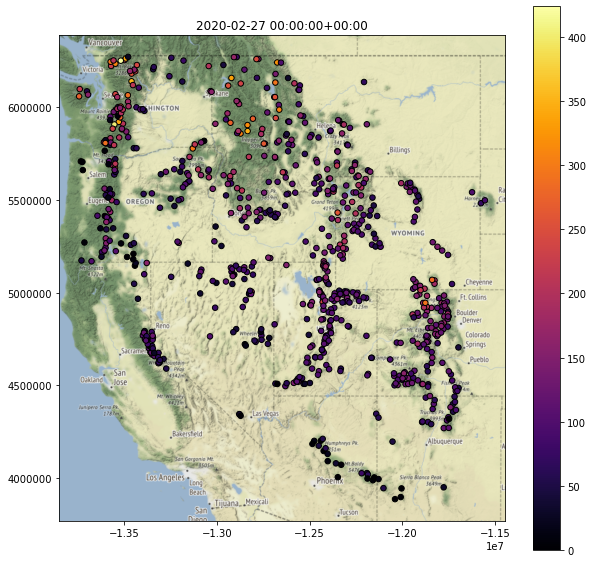

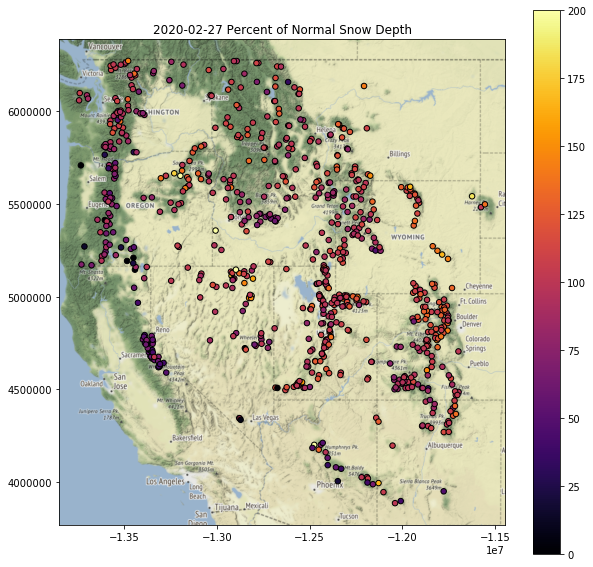

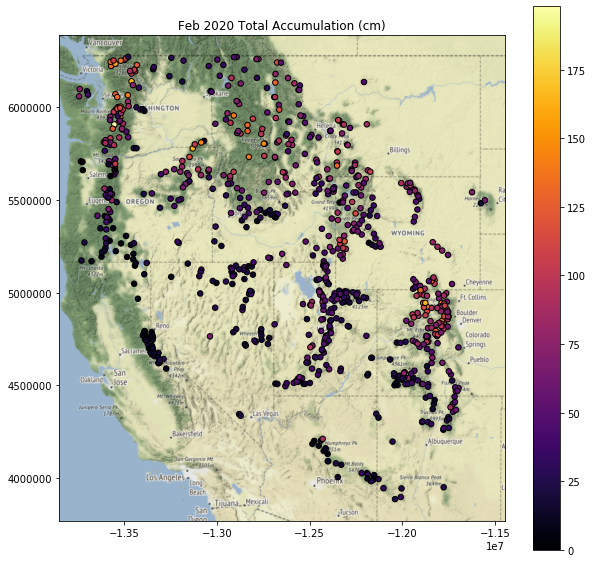

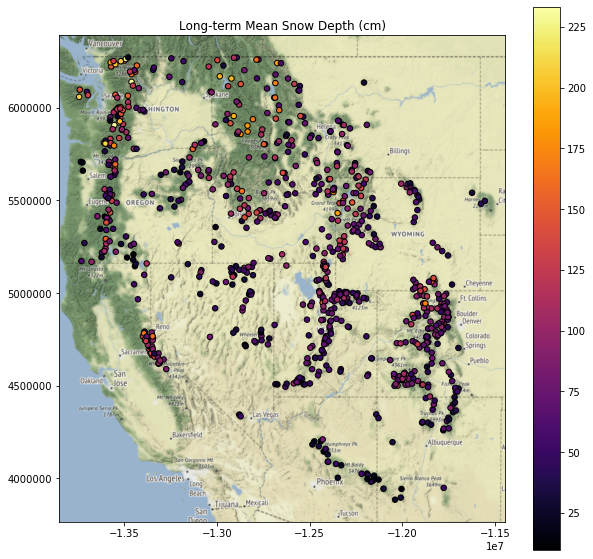

In [160]:
for col in col_list:
    f, ax = plt.subplots(figsize=(10,10))
    ax.set_title(col)
    gdf.to_crs('EPSG:3857')[[col, 'geometry']].dropna().plot(ax=ax, column=col, markersize=30, edgecolor='k', cmap='inferno', legend=True)
    ctx.add_basemap(ax=ax, url=ctx.sources.ST_TERRAIN)
    #gdf[[col, 'geometry']].dropna().plot(ax=ax, column=col, markersize=30, edgecolor='k', cmap='inferno', legend=True)
    #ctx.add_basemap(ax=ax, crs=gdf.crs, url=ctx.sources.ST_TERRAIN)

## Replot percent of normal (descending sort)

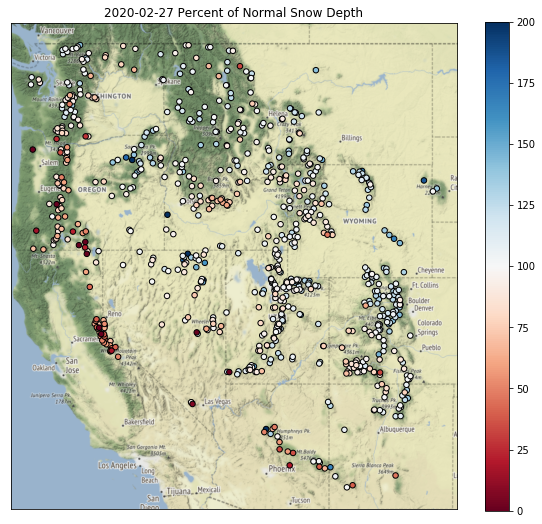

## Replot percent of normal (ascending sort)

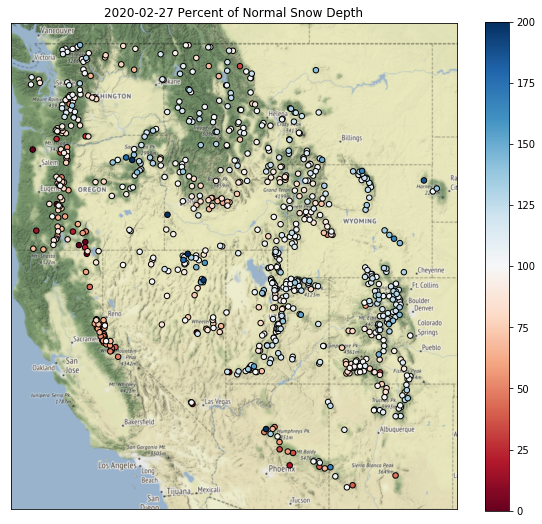

*Note: plotting order can be important, leading to different interpreations! For example, compare values over the Sierra Nevada in CA in the above two plots.*

## Extra Credit: Repeat the above plotting for the WA state extent

## Extra Credit: Limit your analysis to only include stations with >15 years of data

## Can you identify the SNOTEL site with:
* Greatest long-term maximum snow depth
    * Is this necessarily the true maximum?
    * What happens if the snow gets higher than the instrument?
* Greatest Feb 2020 accumulation?
    * Where should I go skiing this weekend if I like deep snow?

# Part 6: Interpolating sparse values
* Let's create continuous gridded values (AKA Raster!) from our sparse point data
* Note that we wouldn't do this in practice, as there are much more sophisticated approaches one should use here, but let's use this dataset to explore some basic interpolation approaches
* We'll use the `scipy.interpolate.griddata` function here, using 'nearest' to start, and `scipy.interpolate.Rbf`

## Interpolate Feb 2020 accumulation pattern

In [168]:
import numpy as np
import scipy.interpolate

## Specify the column name of variable to interpolate

In [169]:
col = ts

## Review the comments/code in the following cells, then run

In [170]:
#Extract the column and geometry, drop NaNs
gdf_dropna = gdf.to_crs(aea_proj)[[col,'geometry']].dropna()
#Pull out (x,y,val)
x = gdf_dropna.geometry.x
y = gdf_dropna.geometry.y
z = gdf_dropna[col]
#Get min and max values
zlim = (z.min(), z.max())

In [171]:
#Compute the spatial extent of the points - we will interpolate across this domain
bounds = gdf_dropna.total_bounds

In [172]:
#Spatial interpolation step of 1 km
dx,dy = (10000,10000)

In [173]:
#Limit to WA state
#bounds = wa_state.total_bounds
#dx,dy = (1000,1000)

In [174]:
#Create 1D arrays of grid cell coordinates in the x and y directions
xi = np.arange(np.floor(bounds[0]), np.ceil(bounds[2]),dx)
yi = np.arange(np.floor(bounds[1]), np.ceil(bounds[3]),dy)

In [175]:
#Function that will plot the interpolated grid, overlaying original values
def plotinterp(zi):
    f, ax = plt.subplots(figsize=(10,10))
    #Define extent of the interpolated grid in projected coordinate system, using matplotlib extent format (left, right, bottom, top)
    mpl_extent = [bounds[0], bounds[2], bounds[1], bounds[3]]
    #Plot the interpolated grid, providing known extent
    #Note: need the [::-1] to flip the grid in the y direction
    ax.imshow(zi[::-1,], cmap='inferno', extent=mpl_extent, clim=zlim)
    #Overlay the original point values with the same color ramp
    gdf_dropna.plot(ax=ax, column=col, cmap='inferno', markersize=30, edgecolor='0.5', vmin=zlim[0], vmax=zlim[1], legend=True)
    #Overlay WA polygon
    #wa_state.plot(ax=ax, facecolor='none', edgecolor='white')
    ax.autoscale(False)
    states_gdf_proj.plot(ax=ax, facecolor='none', edgecolor='white')
    #Make sure aspect is equal
    ax.set_aspect('equal')

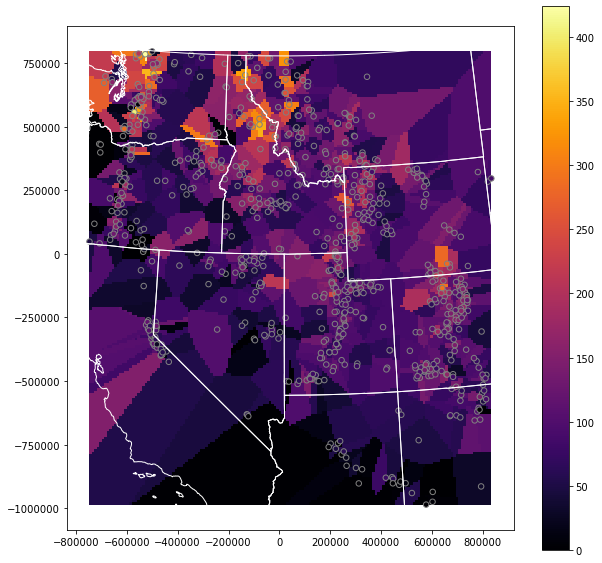

In [176]:
#Create 2D grids from the xi and yi grid cell coordinates
xx, yy = np.meshgrid(xi, yi)
#Interpolate values using griddata
zi = scipy.interpolate.griddata((x,y), z, (xx, yy), method='nearest')
plotinterp(zi)

## Radial basis function interpolation
* https://en.wikipedia.org/wiki/Radial_basis_function_interpolation

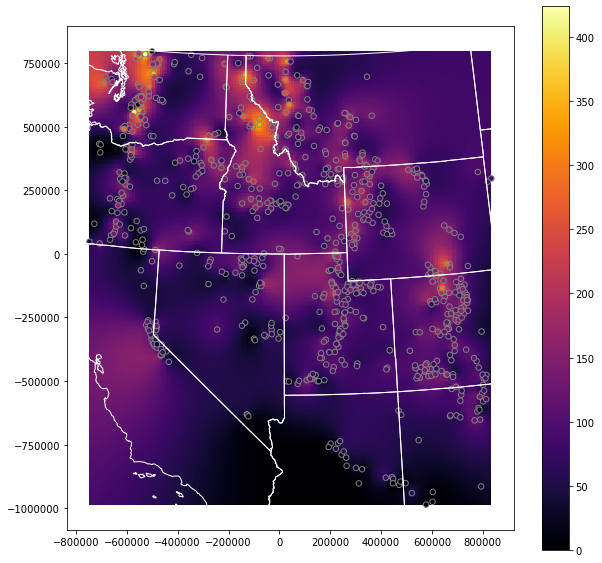

In [177]:
#Use Radial basis function interpolation
f = scipy.interpolate.Rbf(x,y,z, function='linear')
zi = f(xx, yy)
plotinterp(zi)

## Explore this a bit
* Try a few different interpolation methods for griddata and Rbf
    * https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.griddata.html#scipy.interpolate.griddata
    * https://docs.scipy.org/doc/scipy/reference/generated/scipy.interpolate.Rbf.html#scipy.interpolate.Rbf
* Extra Credit: Play around with some other unstructured data interpolation methods
    * https://docs.scipy.org/doc/scipy/reference/interpolate.html#multivariate-interpolation
    * Others outside of scipy.interpolate

## Write out the interpolated snow depth grid using rasterio (raster review)

In [178]:
#Grid origin (center of pixel?)
origin = (xi.min(), yi.min())
print(origin)
#Grid cell size
print(dx, dy)

(-746961.0, -986087.0)
10000 10000


In [179]:
#https://gis.stackexchange.com/questions/279953/numpy-array-to-gtiff-using-rasterio-without-source-raster
import rasterio as rio

transform = rio.transform.from_origin(xi.min(), yi.max(), dx, dy)

out_fn = 'snotel_interp_test.tif'
new_dataset = rio.open(out_fn, 'w', driver='GTiff',
                            height = zi.shape[0], width = zi.shape[1],
                            count=1, dtype=str(zi.dtype),
                            crs=gdf.crs,
                            transform=transform)

new_dataset.write(zi[::-1,], 1)
new_dataset.close()

In [180]:
!ls -l $out_fn

-rw-r--r-- 1 jovyan users 228234 Aug  8 23:49 snotel_interp_test.tif


### Load from disk to verify

{'driver': 'GTiff', 'dtype': 'float64', 'nodata': None, 'width': 159, 'height': 179, 'count': 1, 'crs': CRS.from_epsg(4326), 'transform': Affine(10000.0, 0.0, -746961.0,
       0.0, -10000.0, 793913.0), 'tiled': False, 'interleave': 'band'}


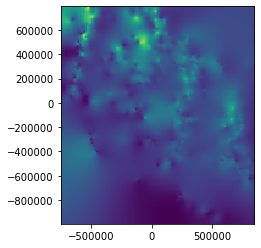

In [181]:
from rasterio.plot import show
with rio.open(out_fn) as src:
    print(src.profile)
    show(src)

## Extra Credit: Explore Kriging

https://scikit-learn.org/stable/modules/gaussian_process.html

## Extra Credit: Clip interpolated grid to buffered radius around all stations
* Clip the interpolated rasters within 20 km of stations

## Extra Credit: Limit interpolation or clip to:
* Mountain ecoregion: https://www.epa.gov/eco-research/level-iii-and-iv-ecoregions-continental-united-states
* Mountain classes: https://rmgsc.cr.usgs.gov/gme/
* Observed recent snowcover mask derived from MODIS data for the corresponding date
    * See great resource **Snow Today** at the National Snow and Ice Data Center: https://nsidc.org/snow-today

## Extra Credit: Consider spatial autocorrelation for the network
Some samples:
* http://darribas.org/gds15/content/labs/lab_06.html  
* http://darribas.org/gds_scipy16/ipynb_md/04_esda.html

## Extra Credit: Snow depth vs. elevation analysis for WA
* Let's look at snow depth across WA on the most recent day in the record
* Create a quick scatterplot of elevation vs. snow depth for all sites on this day
* Do you see a relationship?  

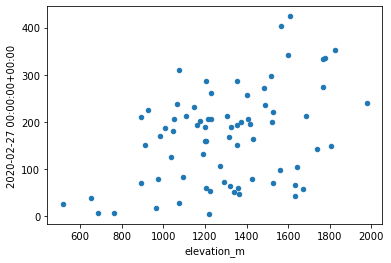

### Try elevation vs. long-term mean

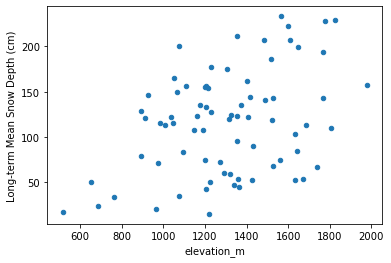

## Extra Credit: Linear regression of snow depth vs. elevation
* How good is your fit?
* Compare accumulation vs elevation for a recent storm event with abundant lowland snow (e.g., Feb 11) with another more typical accumulation event (where low elevations receive rain and mountains receive snow)

r-squared: nan


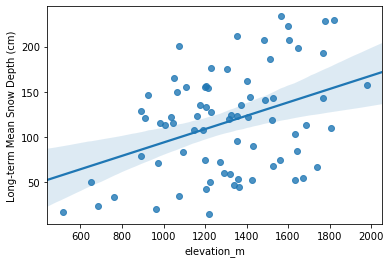

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:            elevation_m   R-squared (uncentered):                   0.836
Model:                            OLS   Adj. R-squared (uncentered):              0.834
Method:                 Least Squares   F-statistic:                              377.6
Date:                Sat, 08 Aug 2020   Prob (F-statistic):                    8.72e-31
Time:                        23:50:27   Log-Likelihood:                         -578.53
No. Observations:                  75   AIC:                                      1159.
Df Residuals:                      74   BIC:                                      1161.
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
Long-term Mean Snow Depth (cm)     9.4435      0.486     19.431      0.000       8.475      10.412
==============================================================================
Omnibus:                       11.062   Durbin-Watson:                   1.651
Prob(Omnibus):                  0.004   Jarque-Bera (JB):                3.494
Skew:                           0.109   Prob(JB):                        0.174
Kurtosis:                       1.965   Cond. No.                         1.00
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Extra Credit: Consider other variables that could affect snow depth
* Distance from the coast (remember the Lab06 exercise calculating distance from WA perimiter?)
* Mean winter daily temperature (from PRISM)

## Extra credit (or, some additional items to explore)

If you have some time (or curiosity), feel free to explore some of these, or define your own questions.  This is a really rich dataset, and those of you interested in snow or hydrology may have some cool ideas.

1. Compute snow depth statistics across all sites grouping by Water Year (or by month/day range where snow is typically present)
1. Identify date of first major snow accumulation event each year, date of max snow depth, date of snow disappearance - any evolution over time?
1. Split sites into elevation bands and analyze various metrics
1. Perform watershed-scale analysis
1. Explore other interpolation methods for sparse data
1. Create an animated map of daily accumulation in WA for the past two weeks
1. Look at other variables for the SNOTEL sites (e.g., snow water equivalent, temperature data)
    * Note that WTEQ_D time series begin much earlier than SNWD_D
1. Create maps of snow density for WA using WTEQ_D and SNWD_D